<a href="https://colab.research.google.com/github/viniciusgomesbatista/pythonintermediario/blob/main/Aula_Final/Aula_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Steel Industry Energy Consumption

https://www.kaggle.com/datasets/csafrit2/steel-industry-energy-consumption

Esta empresa produz diversos tipos de bobinas, chapas de aço e chapas de ferro. As informações sobre o consumo de eletricidade são mantidas em um sistema baseado em nuvem. As informações sobre o consumo de energia da indústria são armazenadas no site da Korea Electric Power Corporation (pccs.kepco.go.kr), e as perspectivas dos dados diários, mensais e anuais são calculadas e apresentadas.

In [4]:
# importar as bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [5]:
df = pd.read_csv('/content/drive/MyDrive/Dados/Steel_industry_data.csv')

In [3]:
df.head()

,date,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,WeekStatus,Day_of_week,Load_Type
0,01/01/2018 00:15,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load
1,01/01/2018 00:30,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load
2,01/01/2018 00:45,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load
3,01/01/2018 01:00,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load
4,01/01/2018 01:15,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load


Attribute Information:
* Date: Dados em tempo contínuo obtidos no primeiro dia do mês
* Usage_kWh: Consumo de energia da indústria kWh contínuo
* Lagging Current: Potência reativa atual Contínuo kVarh
* Leading Current: Potência reativa de corrente principal kVarh contínuo
* CO2: Contínua ppm
* NSM Number of Seconds: Número de segundos a partir da meia-noite Contínuo S
* Week status: Categórico (Fim de semana (0) ou Dia da semana(1))
* Day of week: categórico, segunda-feira: sábado
* Load Type: Carga Leve Categórica, Carga Média, Carga Máxima

In [4]:
df.columns

Index(['date', 'Usage_kWh', 'Lagging_Current_Reactive.Power_kVarh',
       'Leading_Current_Reactive_Power_kVarh', 'CO2(tCO2)',
       'Lagging_Current_Power_Factor', 'Leading_Current_Power_Factor', 'NSM',
       'WeekStatus', 'Day_of_week', 'Load_Type'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   date                                  35040 non-null  object 
 1   Usage_kWh                             35040 non-null  float64
 2   Lagging_Current_Reactive.Power_kVarh  35040 non-null  float64
 3   Leading_Current_Reactive_Power_kVarh  35040 non-null  float64
 4   CO2(tCO2)                             35040 non-null  float64
 5   Lagging_Current_Power_Factor          35040 non-null  float64
 6   Leading_Current_Power_Factor          35040 non-null  float64
 7   NSM                                   35040 non-null  int64  
 8   WeekStatus                            35040 non-null  object 
 9   Day_of_week                           35040 non-null  object 
 10  Load_Type                             35040 non-null  object 
dtypes: float64(6), 

In [6]:
df.shape

(35040, 11)

In [7]:
df.describe()

,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM
count,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000
mean,27.386892,13.035384,3.870949,0.011524,80.578056,84.367870,42750.000000
std,33.444380,16.306000,7.424463,0.016151,18.921322,30.456535,24940.534317
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.200000,2.300000,0.000000,0.000000,63.320000,99.700000,21375.000000
50%,4.570000,5.000000,0.000000,0.000000,87.960000,100.000000,42750.000000
75%,51.237500,22.640000,2.090000,0.020000,99.022500,100.000000,64125.000000
max,157.180000,96.910000,27.760000,0.070000,100.000000,100.000000,85500.000000


In [8]:
df.describe(include='O')

,date,WeekStatus,Day_of_week,Load_Type
count,35040,35040,35040,35040
unique,35040,2,7,3
top,01/01/2018 00:15,Weekday,Monday,Light_Load
freq,1,25056,5088,18072


In [11]:
# transformar coluna date em datetime
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y %H:%M')

In [12]:
df.head()

,date,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,WeekStatus,Day_of_week,Load_Type
0,2018-01-01 00:15:00,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load
1,2018-01-01 00:30:00,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load
2,2018-01-01 00:45:00,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load
3,2018-01-01 01:00:00,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load
4,2018-01-01 01:15:00,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load


In [14]:
# criar novas variáveis para analisar
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['hour'] = df['date'].dt.hour

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 15 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   date                                  35040 non-null  datetime64[ns]
 1   Usage_kWh                             35040 non-null  float64       
 2   Lagging_Current_Reactive.Power_kVarh  35040 non-null  float64       
 3   Leading_Current_Reactive_Power_kVarh  35040 non-null  float64       
 4   CO2(tCO2)                             35040 non-null  float64       
 5   Lagging_Current_Power_Factor          35040 non-null  float64       
 6   Leading_Current_Power_Factor          35040 non-null  float64       
 7   NSM                                   35040 non-null  int64         
 8   WeekStatus                            35040 non-null  object        
 9   Day_of_week                           35040 non-null  object        
 10

In [17]:
df.columns

Index(['date', 'Usage_kWh', 'Lagging_Current_Reactive.Power_kVarh',
       'Leading_Current_Reactive_Power_kVarh', 'CO2(tCO2)',
       'Lagging_Current_Power_Factor', 'Leading_Current_Power_Factor', 'NSM',
       'WeekStatus', 'Day_of_week', 'Load_Type', 'year', 'month', 'day',
       'hour'],
      dtype='object')

In [6]:
df.rename(columns={'Usage_kWh':'usage',
                   'Lagging_Current_Reactive.Power_kVarh':'lagging',
       'Leading_Current_Reactive_Power_kVarh':'leading',
                   'CO2(tCO2)':'CO',
       'Lagging_Current_Power_Factor':'lagging_p', 'Leading_Current_Power_Factor':'leading_p'}, inplace=True)

In [21]:
df.columns

Index(['date', 'usage', 'lagging', 'leading', 'CO', 'lagging_p', 'leading_p',
       'NSM', 'WeekStatus', 'Day_of_week', 'Load_Type', 'year', 'month', 'day',
       'hour'],
      dtype='object')

In [22]:
# Correlações
colunas = ['usage', 'lagging', 'leading', 'CO', 'lagging_p', 'leading_p',
       'NSM', 'year', 'month', 'day',
       'hour']

df[colunas].corr()

,usage,lagging,leading,CO,lagging_p,leading_p,NSM,year,month,day,hour
usage,1.000000,0.896150,-0.324922,0.988180,0.385960,0.353566,2.346103e-01,NaN,-1.139607e-01,-8.170491e-03,2.341748e-01
lagging,0.896150,1.000000,-0.405142,0.886948,0.144534,0.407716,8.266237e-02,NaN,-4.213561e-02,-1.212823e-02,8.125047e-02
leading,-0.324922,-0.405142,1.000000,-0.332777,0.526770,-0.944039,3.716046e-01,NaN,-2.709951e-02,-1.366688e-02,3.727349e-01
CO,0.988180,0.886948,-0.332777,1.000000,0.379605,0.360019,2.317260e-01,NaN,-1.083105e-01,-6.095822e-04,2.313063e-01
lagging_p,0.385960,0.144534,0.526770,0.379605,1.000000,-0.519967,5.652695e-01,NaN,-8.705239e-02,2.568839e-02,5.665439e-01
leading_p,0.353566,0.407716,-0.944039,0.360019,-0.519967,1.000000,-3.605630e-01,NaN,-3.232157e-02,7.403688e-03,-3.614087e-01
NSM,0.234610,0.082662,0.371605,0.231726,0.565270,-0.360563,1.000000e+00,NaN,2.297820e-15,-4.184369e-17,9.991858e-01
year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,-0.113961,-0.042136,-0.027100,-0.108311,-0.087052,-0.032322,2.297820e-15,NaN,1.000000e+00,1.189318e-02,-6.081799e-16
day,-0.008170,-0.012128,-0.013667,-0.000610,0.025688,0.007404,-4.184369e-17,NaN,1.189318e-02,1.000000e+00,1.521688e-16


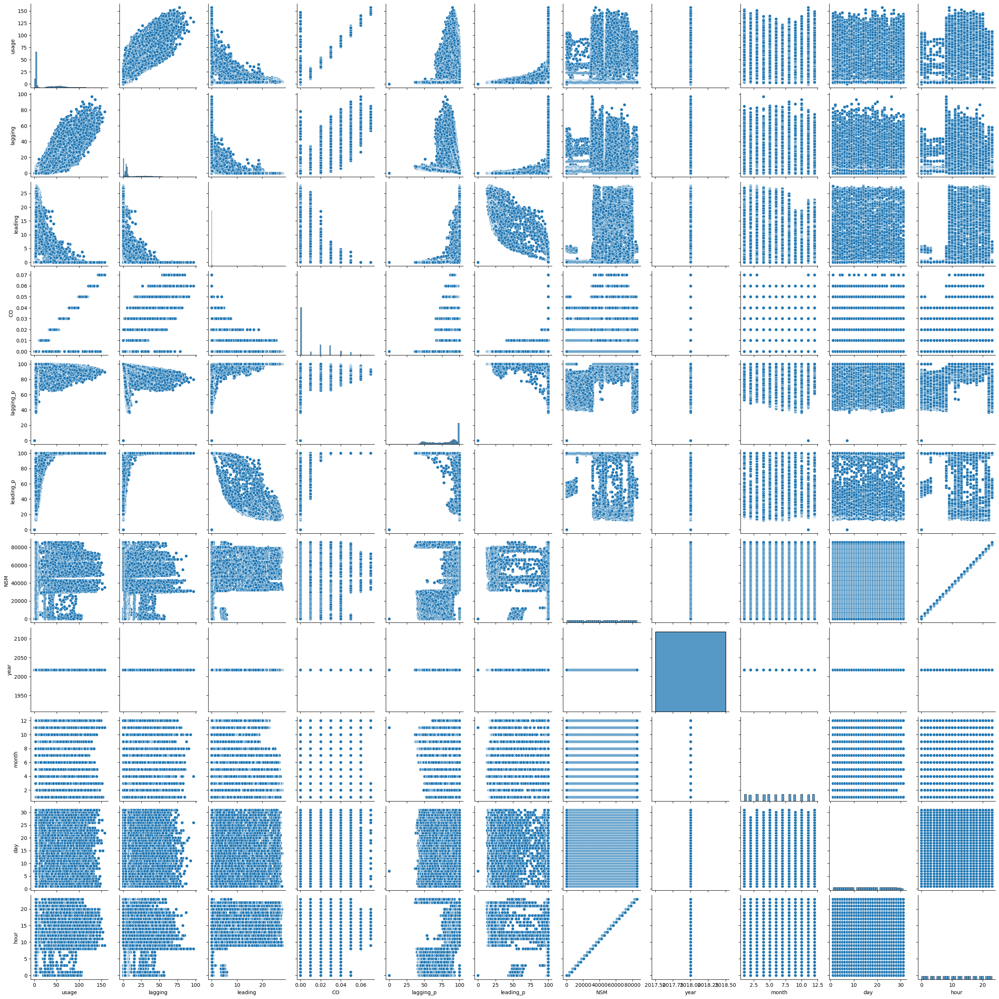

In [23]:
# Criar o pairplot
sns.pairplot(df[colunas])

# Mostrar o gráfico
plt.show()

#Pygwalker

In [ ]:
pip install pygwalker

In [25]:
import pygwalker as pyg

In [26]:
walker = pyg.walk(df)

Box(children=(HTML(value='<div id="ifr-pyg-00061ab8f7caff0cDZ40UGCzmEuXYbvJ" style="height: auto">\n    <head>…

# PyCaret

In [ ]:
pip install pycaret

In [8]:
import pycaret                                        # Pycaret
from pycaret.regression import *                      # Pycaret para Regressão

In [9]:
reg = setup(df, target='usage', train_size=0.8)

,Description,Value
0,Session id,877
1,Target,usage
2,Target type,Regression
3,Original data shape,"(35040, 11)"
4,Transformed data shape,"(35040, 19)"
5,Transformed train set shape,"(28032, 19)"
6,Transformed test set shape,"(7008, 19)"
7,Numeric features,6
8,Categorical features,4
9,Preprocess,True


In [10]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
knn,K Neighbors Regressor,3.9769,77.0940,8.7766,0.9310,0.1399,0.0967,0.8080
huber,Huber Regressor,8.0865,192.7348,13.8751,0.8275,0.6373,0.4121,0.7190
et,Extra Trees Regressor,22.2247,587.9133,24.2412,0.4738,1.4085,4.0466,6.8920
en,Elastic Net,21.7975,680.0416,26.0743,0.3914,1.2905,3.2543,0.5460
par,Passive Aggressive Regressor,20.7533,832.0144,26.1541,0.2612,1.2104,3.4226,0.3680
llar,Lasso Least Angle Regression,27.1947,1018.8958,31.9164,0.0881,1.4672,4.0980,0.3140
lasso,Lasso Regression,27.2115,1020.0578,31.9346,0.0870,1.4678,4.1007,0.3300
omp,Orthogonal Matching Pursuit,26.6292,1054.0140,32.4617,0.0566,1.4303,3.9083,0.3940
xgboost,Extreme Gradient Boosting,27.9075,1081.8603,32.8868,0.0318,1.4825,4.1239,0.6610
lightgbm,Light Gradient Boosting Machine,28.4885,1110.0403,33.3131,0.0065,1.5113,4.3226,1.6820


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

## MAE (Mean Absolute Error)

- **Definição**: Média das diferenças absolutas entre as previsões e os valores reais.
- **Uso**: Mede a precisão das previsões, é fácil de interpretar e menos sensível a outliers.

## MSE (Mean Squared Error)

- **Definição**: Média dos quadrados das diferenças entre as previsões e os valores reais.
- **Uso**: Penaliza erros grandes mais severamente que MAE, útil para modelos onde penalizar grandes erros é desejado.

## RMSE (Root Mean Squared Error)

- **Definição**: Raiz quadrada da média dos quadrados das diferenças entre as previsões e os valores reais.
- **Uso**: Proporciona uma métrica na mesma unidade dos dados originais, é sensível a grandes erros.

## RMSLE (Root Mean Squared Logarithmic Error)

- **Definição**: Raiz quadrada da média dos quadrados das diferenças logarítmicas entre as previsões e os valores reais.
- **Uso**: Penaliza previsões subestimadas mais que superestimadas, adequado quando os dados têm uma distribuição log-normal.

## MAPE (Mean Absolute Percentage Error)

- **Definição**: Média das diferenças absolutas entre as previsões e os valores reais, expressa como uma porcentagem dos valores reais.
- **Uso**: Facilmente interpretável como uma porcentagem, porém pode ser problemático quando os valores reais são próximos de zero.

In [13]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

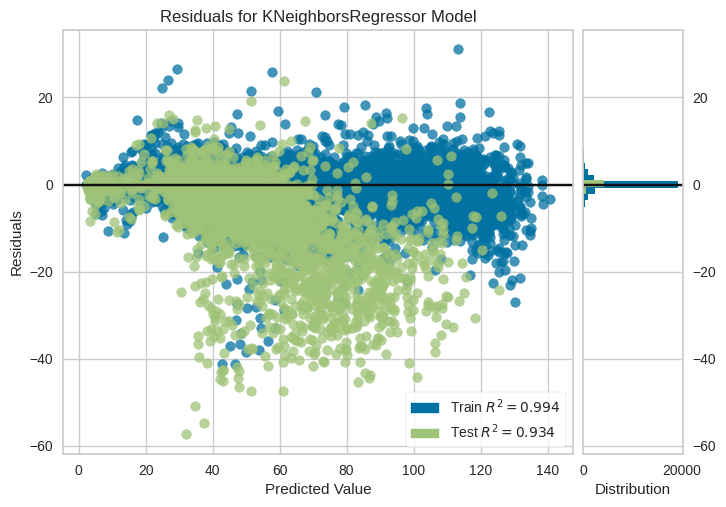

In [12]:
plot_model(best, plot = 'residuals')

In [14]:
predict_model(best)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,K Neighbors Regressor,3.9048,73.8855,8.5957,0.9341,0.1356,0.0937


,date,lagging,leading,CO,lagging_p,leading_p,NSM,WeekStatus,Day_of_week,Load_Type,usage,prediction_label
777,09/01/2018 02:30,4.250000,0.00,0.00,74.029999,100.000000,9000,Weekday,Tuesday,Light_Load,4.680000,5.740000
1657,18/01/2018 06:30,31.389999,0.00,0.02,79.040001,100.000000,23400,Weekday,Thursday,Light_Load,40.500000,54.152000
4468,16/02/2018 13:15,0.000000,16.85,0.00,100.000000,19.889999,47700,Weekday,Friday,Light_Load,3.420000,3.274000
15352,09/06/2018 22:15,1.840000,9.00,0.00,84.599998,30.860001,80100,Weekend,Saturday,Light_Load,2.920000,3.080000
34057,21/12/2018 18:30,0.000000,14.00,0.00,100.000000,35.990002,66600,Weekday,Friday,Maximum_Load,5.400000,5.506000
...,...,...,...,...,...,...,...,...,...,...,...,...
34236,23/12/2018 15:15,0.000000,13.57,0.00,100.000000,25.910000,54900,Weekend,Sunday,Light_Load,3.640000,3.368000
34939,30/12/2018 23:00,2.120000,0.07,0.00,81.849998,99.970001,82800,Weekend,Sunday,Light_Load,3.020000,4.040000
25866,27/09/2018 10:45,33.259998,0.00,0.03,88.139999,100.000000,38700,Weekday,Thursday,Maximum_Load,62.060001,58.355999
11347,29/04/2018 05:00,3.670000,0.00,0.00,58.250000,100.000000,18000,Weekend,Sunday,Light_Load,2.630000,3.116000


In [15]:
#pegando uma linha em específica simulando ser novos dados
novos_dados = df.iloc[[0]]

In [16]:
novos_dados

,date,usage,lagging,leading,CO,lagging_p,leading_p,NSM,WeekStatus,Day_of_week,Load_Type
0,01/01/2018 00:15,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load


In [17]:
predictions = predict_model(best, data=novos_dados)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,K Neighbors Regressor,0.3380,0.1142,0.3380,nan,0.0779,0.1066


In [18]:
#ver predição
predictions

,date,lagging,leading,CO,lagging_p,leading_p,NSM,WeekStatus,Day_of_week,Load_Type,usage,prediction_label
0,01/01/2018 00:15,2.95,0.0,0.0,73.209999,100.0,900,Weekday,Monday,Light_Load,3.17,3.508


#Salvar o meu modelo

In [19]:
save_model(best, 'my_best_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['lagging', 'leading', 'CO',
                                              'lagging_p', 'leading_p', 'NSM'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=['date', 'WeekStatus',
                                              'Day_of_week', 'Load_Type'],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('ordinal_encoding...
                 ('onehot_encoding',
                  TransformerWrapper(include=['Day_of_week', 'Load_Type'],
                                     transformer=OneHotEncoder(cols=['Day_of_week',
                                                                     'Load_Type'],
                                                               handle_missing='return_nan',
             